In [1]:
import pandas as pd
from usagrid import s3

df_forecast = s3.read_pyarrow_from_s3(bucket_name="usagrid",key="silver/PJM/PJM_load_forecast.arrow").to_pandas()

df_metered = s3.read_pyarrow_from_s3(bucket_name="usagrid",key="silver/PJM/PJM_load_metered.arrow").to_pandas().reset_index()

In [2]:
df_metered

,datetime_beginning_utc,datetime_beginning_ept,nerc_region,mkt_region,zone,load_area,mw,is_verified
0,2018-01-01 05:00:00,2018-01-01 00:00:00,RFC,WEST,DAY,DAY,2306.000,False
1,2018-01-01 05:00:00,2018-01-01 00:00:00,RFC,MIDATL,AE,AECO,1261.317,True
2,2018-01-01 05:00:00,2018-01-01 00:00:00,RFC,WEST,AEP,AEPAPT,6787.226,True
3,2018-01-01 05:00:00,2018-01-01 00:00:00,RFC,WEST,AEP,AEPIMP,3158.098,True
4,2018-01-01 05:00:00,2018-01-01 00:00:00,RFC,WEST,AEP,AEPKPT,1141.385,True
...,...,...,...,...,...,...,...,...
1691149,2024-06-18 03:00:00,2024-06-17 23:00:00,RFC,MIDATL,RECO,RECO,209.887,False
1691150,2024-06-18 03:00:00,2024-06-17 23:00:00,RFC,MIDATL,PEP,SMECO,427.960,False
1691151,2024-06-18 03:00:00,2024-06-17 23:00:00,RFC,MIDATL,AE,VMEU,96.608,False
1691152,2024-06-18 03:00:00,2024-06-17 23:00:00,RFC,MIDATL,DPL,EASTON,27.597,False


In [3]:
df_forecast

,evaluated_at_utc,evaluated_at_ept,forecast_hour_beginning_utc,forecast_hour_beginning_ept,forecast_area,forecast_load_mw
0,2018-01-01 22:45:00,2018-01-01 17:45:00,2018-01-01 05:00:00,2018-01-01 00:00:00,EKPC,2699.0
1,2018-01-01 22:45:00,2018-01-01 17:45:00,2018-01-01 05:00:00,2018-01-01 00:00:00,RTO,113534.0
2,2018-01-01 22:45:00,2018-01-01 17:45:00,2018-01-01 05:00:00,2018-01-01 00:00:00,DUQ,1658.0
3,2018-01-01 22:45:00,2018-01-01 17:45:00,2018-01-01 05:00:00,2018-01-01 00:00:00,DAY,2336.0
4,2018-01-01 22:45:00,2018-01-01 17:45:00,2018-01-01 05:00:00,2018-01-01 00:00:00,APS,7582.0
...,...,...,...,...,...,...
5399275,2024-06-19 03:45:00,2024-06-18 23:45:00,2024-06-20 03:00:00,2024-06-19 23:00:00,AEP,17604.0
5399276,2024-06-18 21:45:00,2024-06-18 17:45:00,2024-06-20 03:00:00,2024-06-19 23:00:00,DAY,2548.0
5399277,2024-06-18 21:45:00,2024-06-18 17:45:00,2024-06-20 03:00:00,2024-06-19 23:00:00,ATSI,9865.0
5399278,2024-06-19 03:45:00,2024-06-18 23:45:00,2024-06-20 03:00:00,2024-06-19 23:00:00,ATSI,9865.0


In [4]:
df_metered

,datetime_beginning_utc,datetime_beginning_ept,nerc_region,mkt_region,zone,load_area,mw,is_verified
0,2018-01-01 05:00:00,2018-01-01 00:00:00,RFC,WEST,DAY,DAY,2306.000,False
1,2018-01-01 05:00:00,2018-01-01 00:00:00,RFC,MIDATL,AE,AECO,1261.317,True
2,2018-01-01 05:00:00,2018-01-01 00:00:00,RFC,WEST,AEP,AEPAPT,6787.226,True
3,2018-01-01 05:00:00,2018-01-01 00:00:00,RFC,WEST,AEP,AEPIMP,3158.098,True
4,2018-01-01 05:00:00,2018-01-01 00:00:00,RFC,WEST,AEP,AEPKPT,1141.385,True
...,...,...,...,...,...,...,...,...
1691149,2024-06-18 03:00:00,2024-06-17 23:00:00,RFC,MIDATL,RECO,RECO,209.887,False
1691150,2024-06-18 03:00:00,2024-06-17 23:00:00,RFC,MIDATL,PEP,SMECO,427.960,False
1691151,2024-06-18 03:00:00,2024-06-17 23:00:00,RFC,MIDATL,AE,VMEU,96.608,False
1691152,2024-06-18 03:00:00,2024-06-17 23:00:00,RFC,MIDATL,DPL,EASTON,27.597,False


# +-5% margin of error for assumption there was a good forecast

In [114]:
forecast_metered = df_metered.merge(df_forecast,left_on=["datetime_beginning_utc","load_area"],
                               right_on=["forecast_hour_beginning_utc","forecast_area"],
                               how="left",
                           indicator=True
                              )

forecast_metered["year"] = forecast_metered["datetime_beginning_utc"].dt.year

In [115]:
forecast_metered["forecast_metered_pct"] = forecast_metered["forecast_load_mw"]/forecast_metered["mw"]

forecast_metered["forecast_metered_diff"] = forecast_metered["forecast_load_mw"] - rto_forecast_metered["mw"]

forecast_metered["missed_forecast"] = (forecast_metered["forecast_metered_pct"] <= 0.95) | (rto_forecast_metered["forecast_metered_pct"] >= 1.05)

In [166]:
forecast_metered.loc[forecast_metered["forecast_metered_diff"].isna()].query('load_area == "DEOK"')

,datetime_beginning_utc,datetime_beginning_ept,nerc_region,mkt_region,zone,load_area,mw,is_verified,evaluated_at_utc,evaluated_at_ept,forecast_hour_beginning_utc,forecast_hour_beginning_ept,forecast_area,forecast_load_mw,_merge,year,forecast_metered_pct,forecast_metered_diff,missed_forecast
101416,2018-02-21 05:00:00,2018-02-21 00:00:00,RFC,WEST,DEOK,DEOK,2342.602,True,NaT,NaT,NaT,NaT,<NA>,NaN,left_only,2018,NaN,NaN,False
101482,2018-02-21 06:00:00,2018-02-21 01:00:00,RFC,WEST,DEOK,DEOK,2261.623,True,NaT,NaT,NaT,NaT,<NA>,NaN,left_only,2018,NaN,NaN,False
101539,2018-02-21 07:00:00,2018-02-21 02:00:00,RFC,WEST,DEOK,DEOK,2202.627,True,NaT,NaT,NaT,NaT,<NA>,NaN,left_only,2018,NaN,NaN,False
101596,2018-02-21 08:00:00,2018-02-21 03:00:00,RFC,WEST,DEOK,DEOK,2181.582,True,NaT,NaT,NaT,NaT,<NA>,NaN,left_only,2018,NaN,NaN,False
3013225,2022-08-06 04:00:00,2022-08-06 00:00:00,RFC,WEST,DEOK,DEOK,3137.002,False,NaT,NaT,NaT,NaT,<NA>,NaN,left_only,2022,NaN,NaN,False
3013259,2022-08-06 05:00:00,2022-08-06 01:00:00,RFC,WEST,DEOK,DEOK,2989.825,False,NaT,NaT,NaT,NaT,<NA>,NaN,left_only,2022,NaN,NaN,False
3013285,2022-08-06 06:00:00,2022-08-06 02:00:00,RFC,WEST,DEOK,DEOK,2879.212,False,NaT,NaT,NaT,NaT,<NA>,NaN,left_only,2022,NaN,NaN,False
3013318,2022-08-06 07:00:00,2022-08-06 03:00:00,RFC,WEST,DEOK,DEOK,2771.224,False,NaT,NaT,NaT,NaT,<NA>,NaN,left_only,2022,NaN,NaN,False
3981243,2023-12-09 05:00:00,2023-12-09 00:00:00,RFC,WEST,DEOK,DEOK,2383.478,False,NaT,NaT,NaT,NaT,<NA>,NaN,left_only,2023,NaN,NaN,False
3981273,2023-12-09 06:00:00,2023-12-09 01:00:00,RFC,WEST,DEOK,DEOK,2297.611,False,NaT,NaT,NaT,NaT,<NA>,NaN,left_only,2023,NaN,NaN,False


# Most are above 80% correctly forecasted DEOK is the only one that has decreased in recent years

In [161]:
missed_forecast_count

,load_area,year,missed_forecast,count
0,RTO,2022,False,125751
1,DOM,2022,False,117337
2,DUQ,2022,False,113721
3,DEOK,2022,False,112219
4,DAY,2022,False,109486
...,...,...,...,...
247,DOM,2024,True,2176
248,RTO,2021,True,1764
249,RTO,2023,True,1431
250,OVEC,2018,False,739


In [162]:
missed_forecast_mw

,load_area,year,forecast_metered_diff
0,AECO,2018,0.0
1,AECO,2019,0.0
2,AECO,2020,0.0
3,AECO,2021,0.0
4,AECO,2022,0.0
...,...,...,...
205,VMEU,2020,0.0
206,VMEU,2021,0.0
207,VMEU,2022,0.0
208,VMEU,2023,0.0


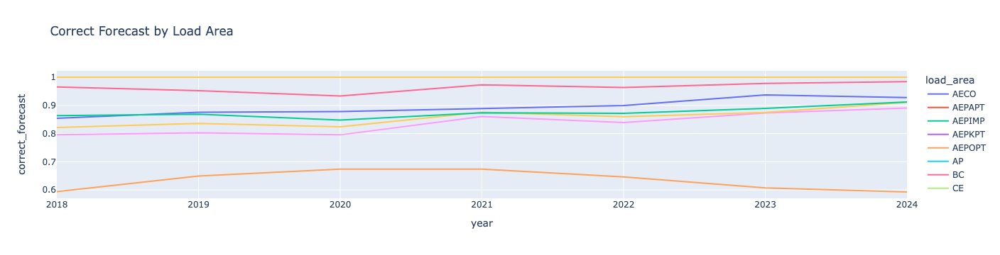

In [173]:
missed_forecast_count = forecast_metered[["load_area","year","missed_forecast"]].value_counts().to_frame().reset_index()

missed_forecast_count = missed_forecast_count.pivot_table(index=["load_area","year"],columns=["missed_forecast"]).fillna(0).droplevel(0,axis=1).reset_index()

missed_forecast_count["correct_forecast"] = missed_forecast_count[False]/(missed_forecast_count[False]+missed_forecast_count[True])

missed_forecast_mw = forecast_metered.groupby(["load_area","year"]).agg({"forecast_metered_diff":"sum"}).reset_index()


missed_forcast = missed_forecast_count.merge(missed_forecast_mw,on=["load_area","year"],how="left")


px.line(missed_forcast,x="year",y="correct_forecast",color="load_area",title="Correct Forecast by Load Area")


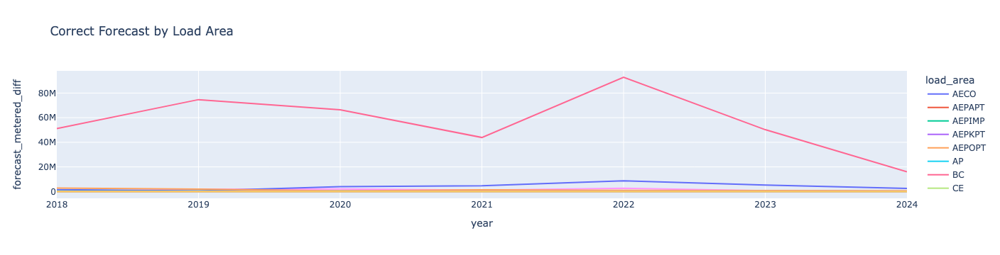

In [174]:
px.line(missed_forcast,x="year",y="forecast_metered_diff",color="load_area",title="Correct Forecast by Load Area")


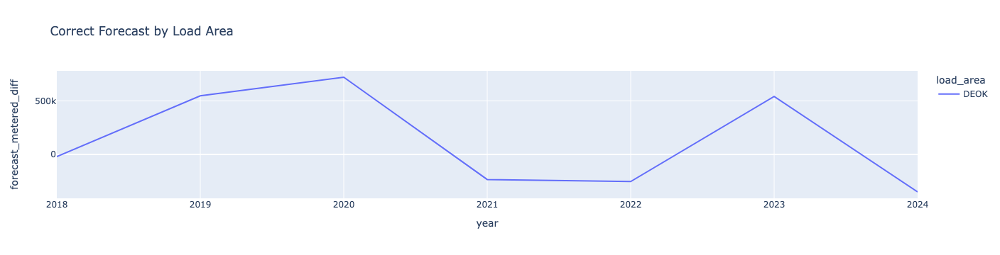

In [175]:
px.line(missed_forcast.query('load_area=="DEOK"'),x="year",y="forecast_metered_diff",color="load_area",title="Correct Forecast by Load Area")


In [187]:
average_ky_price_kwh = 0.057

average_ky_price_mw = average_ky_price_kwh * 1000

deok_missed_forecast = missed_forcast.query('load_area=="DEOK"')

deok_missed_forecast = deok_missed_forecast.assign(mw_dollars=round(deok_missed_forecast["forecast_metered_diff"] * average_ky_price_mw))

deok_missed_forecast


,load_area,year,False,True,correct_forecast,forecast_metered_diff,mw_dollars
63,DEOK,2018,56145.0,12219.0,0.821266,-19820.391,-1129762.0
64,DEOK,2019,54703.0,10711.0,0.836258,546676.398,31160555.0
65,DEOK,2020,54073.0,11550.0,0.823995,719944.794,41036853.0
66,DEOK,2021,57235.0,8141.0,0.875474,-232901.367,-13275378.0
67,DEOK,2022,112219.0,18264.0,0.860028,-251631.546,-14342998.0
68,DEOK,2023,56845.0,8132.0,0.874848,541321.697,30855337.0
69,DEOK,2024,27471.0,2689.0,0.910842,-348980.508,-19891889.0


In [ ]:
30,855,337.0

# Deep dive on DEOK

In [154]:
df_deok = forecast_metered.set_index("datetime_beginning_utc").query(f'load_area == "DEOK"')["2023":"2023"]

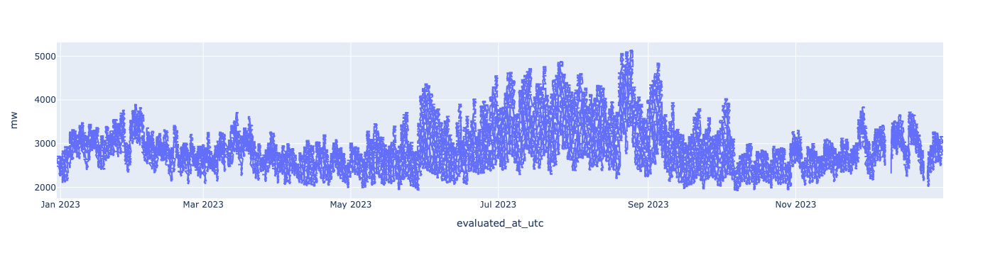

In [91]:
px.line(df_deok,x="evaluated_at_utc",y="mw")

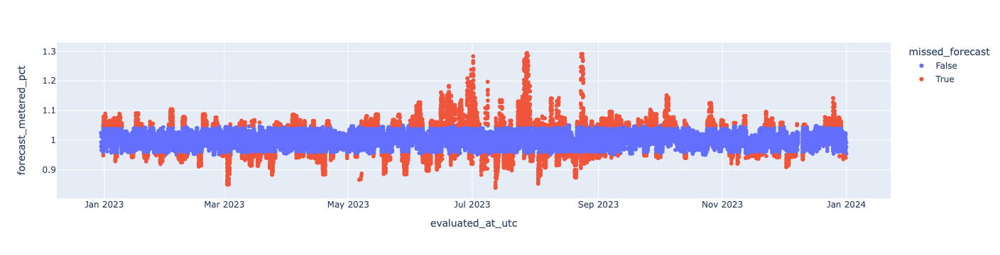

In [92]:
import plotly.express as px

px.scatter(df_deok,x="evaluated_at_utc",y="forecast_metered_pct",color="missed_forecast")

In [93]:
df_deok.describe(include="all").T

,count,unique,top,freq,mean,min,25%,50%,75%,max,std
datetime_beginning_ept,64977,NaN,NaN,NaN,2023-07-01 07:19:08.363266816,2022-12-31 19:00:00,2023-04-02 06:00:00,2023-07-01 12:00:00,2023-09-29 17:00:00,2023-12-31 18:00:00,NaN
nerc_region,64977,1,RFC,64977,NaN,NaN,NaN,NaN,NaN,NaN,NaN
mkt_region,64977,1,WEST,64977,NaN,NaN,NaN,NaN,NaN,NaN,NaN
zone,64977,1,DEOK,64977,NaN,NaN,NaN,NaN,NaN,NaN,NaN
load_area,64977,1,DEOK,64977,NaN,NaN,NaN,NaN,NaN,NaN,NaN
mw,64977.0,NaN,NaN,NaN,2957.867548,1927.776,2609.529,2859.463,3220.386,5134.898,529.777888
is_verified,64977,2,True,55632,NaN,NaN,NaN,NaN,NaN,NaN,NaN
evaluated_at_utc,64945,NaN,NaN,NaN,2023-06-30 17:24:44.885673472,2022-12-30 10:45:00,2023-04-01 15:45:00,2023-06-30 15:45:00,2023-09-29 03:45:00,2023-12-31 22:45:00,NaN
evaluated_at_ept,64945,NaN,NaN,NaN,2023-06-30 13:04:19.571945984,2022-12-30 05:45:00,2023-04-01 11:45:00,2023-06-30 11:45:00,2023-09-28 23:45:00,2023-12-31 17:45:00,NaN
forecast_hour_beginning_utc,64945,NaN,NaN,NaN,2023-07-01 09:43:48.673492736,2023-01-01 00:00:00,2023-04-02 08:00:00,2023-07-01 14:00:00,2023-09-29 18:00:00,2023-12-31 23:00:00,NaN


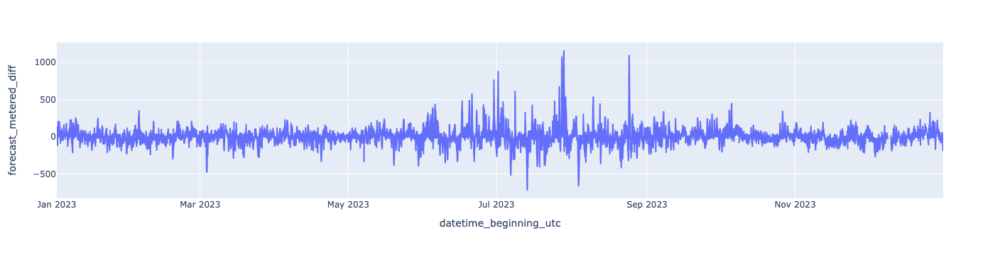

In [111]:
cumsum_diff = df_deok["forecast_metered_diff"].reset_index()

px.line(cumsum_diff,x="datetime_beginning_utc",y="forecast_metered_diff")

# Why uptick in August and can it be mitgated?

<Axes: xlabel='datetime_beginning_utc'>

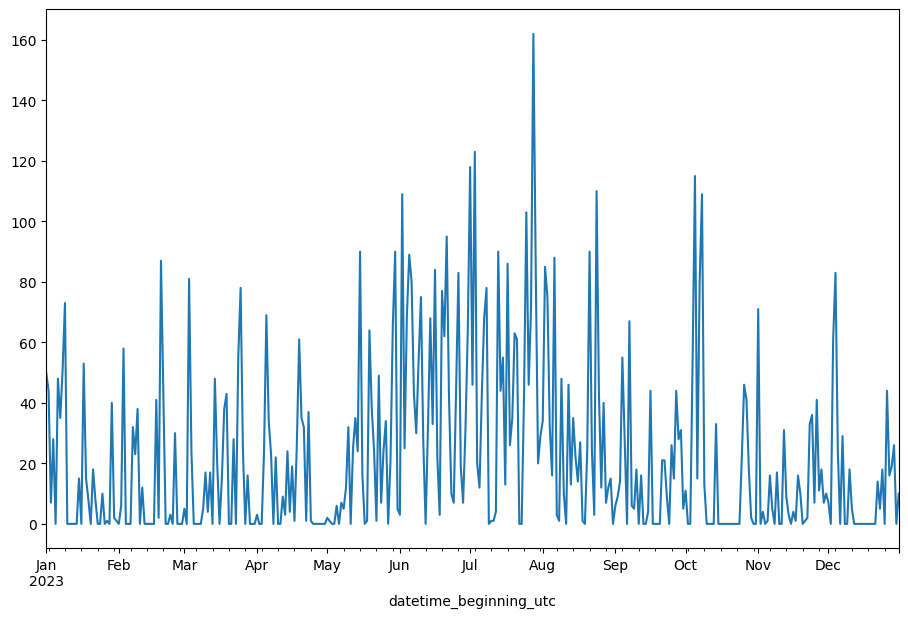

In [193]:
df_deok.resample("D").sum(numeric_only=True)["missed_forecast"].plot(figsize=(11,7))